In [1]:
import warnings

import pandas as pd
import plotly.express as px

from ydata_profiling import ProfileReport

warnings.filterwarnings("ignore")

import os

In [2]:
dir = os.path.dirname(os.path.realpath('__file__'))
root = os.path.realpath(os.path.join(dir, ".."))
merged_data_path = os.path.join(root, "data" , "merged_data")

In [3]:
data = pd.read_csv(os.path.join(merged_data_path, "data.csv"))
data

,library_name,library_address,customer_gender,customer_education,customer_occupation,customer_age,customer_age_group,customer_address,customer_library_distance_km,book_title,book_authors,book_categories,book_price,book_pages,book_age,book_out_of_library_days,returned_late
0,Multnomah County Library Woodstock,"6008 SE 49th Ave, Portland, OR 97206",female,Graduate Degree,Tech,53,35-60,"4942 SE 28th Ave, Portland, OR 97202",2.153,Indian Financial System 5E,Khan,Unknown,416.99,752,12,14,0
1,Multnomah County Library,"205 NE Russell St, Portland, OR 97212",male,Graduate Degree,Education & Health,55,35-60,"2821 NE Klickitat St, Portland, OR 97212",2.196,Advertising Management,"C. L. Tyagi, Arun Kumar",Advertising,217.00,790,14,62,1
2,Multnomah County Library Kenton,"8226 N Denver Ave, Portland, OR 97217",male,Graduate Degree,Education & Health,33,18-35,"6614 N Wilbur Ave, Portland, OR 97217",1.439,Geostatistics for Natural Resources Evaluation,"Pierre Goovaerts, Department of Civil and Envi...",Science,414.50,561,21,25,0
3,Multnomah County Library North Portland,"512 N Killingsworth St, Portland, OR 97217",male,High School,Business & Finance,41,35-60,"2617 NE 33rd Ave, Portland, OR 97212",3.936,Highlights of Natural Resources Management,United States. National Park Service,Conservation of natural resources,149.00,530,24,21,0
4,Multnomah County Library,"205 NE Russell St, Portland, OR 97212",female,College,Tech,50,35-60,"5425 SE Lafayette St, Portland, OR 97206",6.624,Some Vocational Resources and Needs of a Rural...,Edwin Ray Hoskins,Agricultural education,432.50,684,94,18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1481,Multnomah County Library St Johns,"7510 N Charleston Ave, Portland, OR 97203",female,Others,Blue Collar,13,Under 18,"11122 NW Saltzman Rd, Portland, OR 97229",4.617,International Record of Medicine and General P...,"Edward Swift Dunster, Frank Pierce Foster, Jam...",Medicine,45.00,124,97,84,1
1482,Multnomah County Library Holgate,"7905 SE Holgate Blvd, Portland, OR 97206",female,High School,Blue Collar,39,35-60,"3567 SE 92nd Ave, Portland, OR 97266",1.219,International Banking and Financial Centers,"Yoon Park, Yoon S. Park, Musa Essayyad",Business & Economics,276.50,545,29,171,1
1483,Multnomah County Library Hillsdale,"1525 SW Sunset Blvd, Portland, OR 97239",female,Graduate Degree,Sales,24,18-35,"3392 SW 78th Ave, OR 97225",5.286,Elements of Mechanics,George William Parker,Mechanics,654.50,602,107,165,1
1484,Multnomah County Library Sellwood Moreland,"7860 SE 13th Ave, Portland, OR 97202",female,Others,Sales,68,60+,"5900 SW 27th Ct, Portland, OR 97239",4.392,Popular Mechanics,Unknown,Unknown,281.99,432,66,120,1


In [4]:
#profile = ProfileReport(data, title="Data Report")
#profile.to_file("profiling_reports/data_profile.html")

In [5]:
common_layout = dict(width=600,
                    height=400,
                    title_x=0.5,
                    margin=dict(t=10, b=10, l=10, r=10)
                    )

In [6]:
# dataset consists of 1486 examples: 1139 on-time cases (76.6%) and 347 late cases (23.4%)
value_counts = data["returned_late"].value_counts()

fig = px.pie(values=value_counts, names= ["0 - book returned on time", "1 - book returned late"], opacity=0.9)
fig.update_layout(**common_layout)
fig.show()
fig.write_html("charts/target_distribution_piechart.html")

In [7]:
# distribution skewed on left (positive skewness), 50% of books are returned within 19 days from checkout (median), 75% of books are returned within 27 days from checkout(Q3), mean borrowing period is 39.3 days
fig = px.histogram(data, x="book_out_of_library_days",opacity=0.9)
fig.update_layout(**common_layout)
fig.show()
fig.write_html("charts/target_distribution_histogram.html")

In [8]:
def box_plot(data, column):
    fig = px.box(data, y = column, color = "returned_late")
    fig.update_layout(**common_layout)
    fig.show()
    fig.write_html(f"charts/{column}_boxplot.html")

In [9]:
# # mean book age is 59.5 years, not meaningful feature, same behaviour for both classes
box_plot(data, column="book_age")

In [10]:
data.groupby("returned_late")["book_age"].agg(["mean", "median"])

,mean,median
returned_late,,
0,59.798946,40.0
1,58.533141,39.0


In [11]:
data["book_age_group"] = pd.cut(data["book_age"], bins=[0, 2, 10, 30, 50, 200], labels=["New", "Recent", "Modern", "Older", "Vintage"])

In [12]:
def barchart_plot(data, column, apply_common_layout=True):
    values = data.groupby(column)["returned_late"].mean().reset_index()
    values["returned_late"] = values["returned_late"].round(3)
    values.rename(columns = {"returned_late": "late_return_rate"}, inplace=True)
    fig = px.bar(values, x = column, y = "late_return_rate", text_auto=True, opacity=0.9)
    if apply_common_layout:
        fig.update_layout(**common_layout)
    fig.show()
    fig.write_html(f"charts/{column}_barchart.html")

In [13]:
# the highest percentage of late returns for books published within last 3-10 years (28%)
# the lowest percentage of late returns for books published within last 31-50 years (21%)
barchart_plot(data, column="book_age_group")

In [14]:
box_plot(data, column="book_pages")

In [15]:
# books with more pages are more likely to be returned late. On average, books that are returned late have 27 more pages than those returned on time
data.groupby("returned_late")["book_pages"].agg(["mean", "median"])

,mean,median
returned_late,,
0,583.624232,574.0
1,610.991354,616.0


In [16]:
box_plot(data, column="book_price")

In [17]:
# books with higher prices are more likely to be returned late. Books that are returned late are, on average, $21 more expensive than those returned on time
data.groupby("returned_late")["book_price"].agg(["mean", "median"])

,mean,median
returned_late,,
0,302.330395,305.99
1,323.454755,331.99


In [18]:
data["returned_late"] = data["returned_late"].astype(str)
fig = px.scatter(data, x="book_price", y="book_pages", color="returned_late", opacity=0.9)
fig.update_layout(**common_layout)
fig.show()
fig.write_html("charts/book_price_pages_scatter.html")
data["returned_late"] = data["returned_late"].astype(int)

In [19]:
def get_top_3_most_frequent(data, column):
    top = data[column].value_counts().reset_index()[column][:4].to_list()

    if "Unknown" in top:
        top.remove("Unknown")
    else:
        top = top[:3]

    tmp_df = data.groupby(column)["returned_late"].mean().reset_index()
    return tmp_df[tmp_df[column].isin(top)]

In [20]:
# book categories is missing in 14.3% of cases (Unknown)
data["book_categories"].value_counts(normalize=True)

book_categories
Unknown                        0.142665
Business & Economics           0.129879
Medicine                       0.073351
Advertising                    0.057201
Science                        0.043069
                                 ...   
Utah                           0.002019
Steam-engines                  0.002019
Barrier islands                0.001346
Mathematics                    0.001346
Financial services industry    0.001346
Name: proportion, Length: 87, dtype: float64

In [21]:
# late return rate for top 3 most frequent book categories
plot_df = get_top_3_most_frequent(data, column="book_categories")
barchart_plot(plot_df, column="book_categories")

In [22]:
def book_categories(category):
    top_categories = ["Unknown", "Business & Economics", "Medicine", "Advertising", "Science"] #45% of cases
    category = "Others" if category not in top_categories else category
    return category

data["book_categories"] = data["book_categories"].apply(book_categories)

data.groupby("book_categories")["returned_late"].mean()

book_categories
Advertising             0.258824
Business & Economics    0.202073
Medicine                0.155963
Others                  0.236938
Science                 0.265625
Unknown                 0.268868
Name: returned_late, dtype: float64

In [23]:
# book authors are missing in 27.9% of cases (Unknown)
data["book_authors"].value_counts(normalize=True)

book_authors
Unknown                                                                                 0.278600
Pierre Goovaerts, Department of Civil and Environmental Engineering Pierre Goovaerts    0.010094
Philip Reeve                                                                            0.009421
Marie-Renée Bakker, Alexandra Gröss, World Bank                                         0.008748
Periasamy                                                                               0.008075
                                                                                          ...   
John Bourne                                                                             0.001346
Rosser Reeves                                                                           0.001346
Gurusamy                                                                                0.001346
Murthy                                                                                  0.000673
Oma Gupta        

In [24]:
# late return rate for top 3 most frequent book authors
column = "book_authors"
plot_df = get_top_3_most_frequent(data, column=column)

plot_df["returned_late"] = plot_df["returned_late"].round(3)
plot_df.rename(columns = {"returned_late": "late_return_rate"}, inplace=True)
fig = px.bar(plot_df, x = column, y = "late_return_rate", text_auto=True, opacity=0.9, color=column)
fig.update_layout(xaxis={'visible': False, 'showticklabels': False})
fig.show()
fig.write_html(f"charts/{column}_barchart.html")

In [25]:
# late return rate for top 3 most frequent book titles
plot_df = get_top_3_most_frequent(data, column="book_title")
barchart_plot(plot_df, column="book_title")

In [26]:
box_plot(data, column="customer_library_distance_km")

In [27]:
# customers who live farther from the library are more likely to return books late
# customers who return books late live, on average, 2.24 km farther from the library than those who return books on time
data.groupby("returned_late")["customer_library_distance_km"].agg(["mean", "median"])

,mean,median
returned_late,,
0,4.278858,3.948
1,6.519697,5.928


In [28]:
fig = px.histogram(data, x="customer_library_distance_km",color="returned_late",opacity=0.9, barmode="group")
fig.update_layout(**common_layout)
fig.show()
fig.write_html("charts/customer_library_distance_km_distribution.html")

In [29]:
from geopy.geocoders import Nominatim

def get_coordinates(address):

    geolocator = Nominatim(user_agent="data-science", timeout=10)

    try:
        location = geolocator.geocode(address)
        if location:
            lat, lon =  location.latitude, location.longitude
        else:
            print("Address not found")
            return None

    except Exception as e:
        print(f"An unexpected error occurred: {e}")

    return lat, lon

library_df = data[["library_name", "library_address"]].drop_duplicates()

library_df["library_coordinates"] = library_df["library_address"].apply(get_coordinates)
library_df["library_lat"] = library_df["library_coordinates"].apply(lambda x: x[0])
library_df["library_lon"] = library_df["library_coordinates"].apply(lambda x: x[1])

library_df["size"] = 1
fig = px.scatter_mapbox(library_df, lat="library_lat", lon="library_lon", color="library_name", mapbox_style="open-street-map", zoom=9,size="size", size_max = 15)
fig.show()
fig.write_html("charts/libraries_map.html")

In [30]:
# Multnomah County Library Albina is a library with the highest percentage of late returns (29.5%)
# Multnomah County Library Capitol Hill is a library with the lowest percentage of the late returns (15.1%)
barchart_plot(data, column="library_name", apply_common_layout=False)

In [31]:
# customers from Washington have much higher late return rate than those from Oregon, 51.4% compared to 22.6% (expected, all libraries are in Oregon), 2.5% of customers are located in Washington
data["customer_state"] = data["customer_address"].apply(lambda x: x.split(", ")[-1][:2])
barchart_plot(data, column="customer_state")

In [32]:
# the lowest percentage of late returns is in the group of older customers (19.2%) - retired, time for reading
# the highest percentage of late returns is in the group of 35-60 year-olds, who are working and have less time for everyday reading (25.7%)
barchart_plot(data, column="customer_age_group")

In [33]:
box_plot(data, column="customer_age")

In [34]:
# customer occupation is missing in 5.2% of cases
data["customer_occupation"].value_counts(normalize=True)

customer_occupation
Admin & Support       0.145357
Others                0.141319
Education & Health    0.135935
Sales                 0.135262
Tech                  0.133917
Business & Finance    0.129879
Blue Collar           0.126514
Unknown               0.051817
Name: proportion, dtype: float64

In [35]:
# highest percentage of late returns in group of Tech customer occupation (26.6%)
# lowest percentage of late returns in group of Education & Health customer occupation (21%)
barchart_plot(data, column="customer_occupation")

In [36]:
# customer education is missing in 5.2% of cases
data["customer_education"].value_counts(normalize=True)

customer_education
High School        0.253028
Others             0.235532
College            0.234859
Graduate Degree    0.224764
Unknown            0.051817
Name: proportion, dtype: float64

In [37]:
# Graduates have the lowest late return rate - 21%
barchart_plot(data, column="customer_education")

In [38]:
# Men return books late more frequently (25% late return rate compared to 22% for women)
barchart_plot(data, column="customer_gender")

In [4]:
data["returned_late"] = data["returned_late"].astype(str)
fig = px.scatter_3d(data, x="book_pages", y="book_price", z="customer_library_distance_km", color="returned_late")
fig.show()
data["returned_late"] = data["returned_late"].astype(int)

In [40]:
numerical_df = data.select_dtypes(include=["float64","int64", "int32"])

corr_matrix = numerical_df.corr().round(2)
fig = px.imshow(corr_matrix, text_auto=True, zmin=-1, zmax=1, color_continuous_scale='blues')
fig.update_layout(**common_layout)
fig.show()
fig.write_html("charts/corr_heatmap.html")

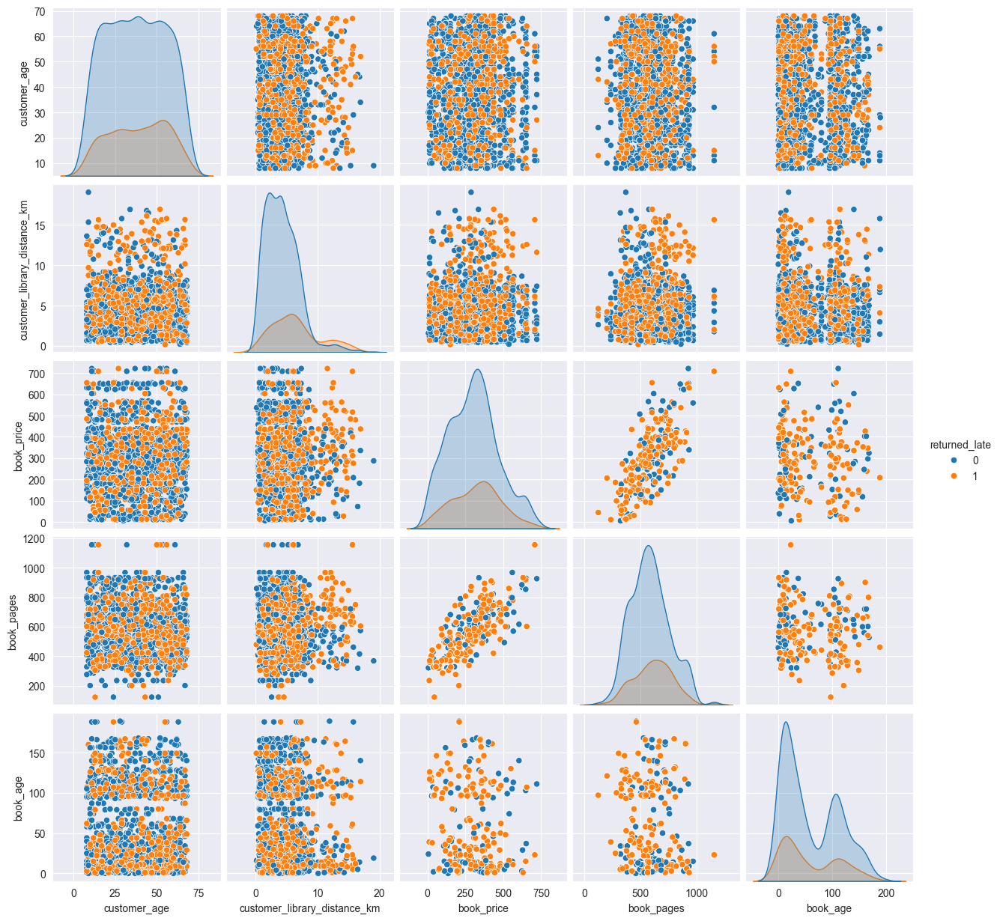

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

pairplot = sns.pairplot(data.drop(columns=["book_out_of_library_days"]), hue = "returned_late")
plt.show()
pairplot.fig.savefig("charts/pairplot.png")

In [42]:
use_cols = ["customer_gender", "customer_education", "customer_occupation", "customer_age", "customer_library_distance_km", "book_categories", "book_price", "book_pages", "book_age", "returned_late"]

data = data[use_cols]
data.to_csv(os.path.join(merged_data_path, "modeling_data.csv"), index=False)